# TRI-MODEL WITH SHARED TAK1

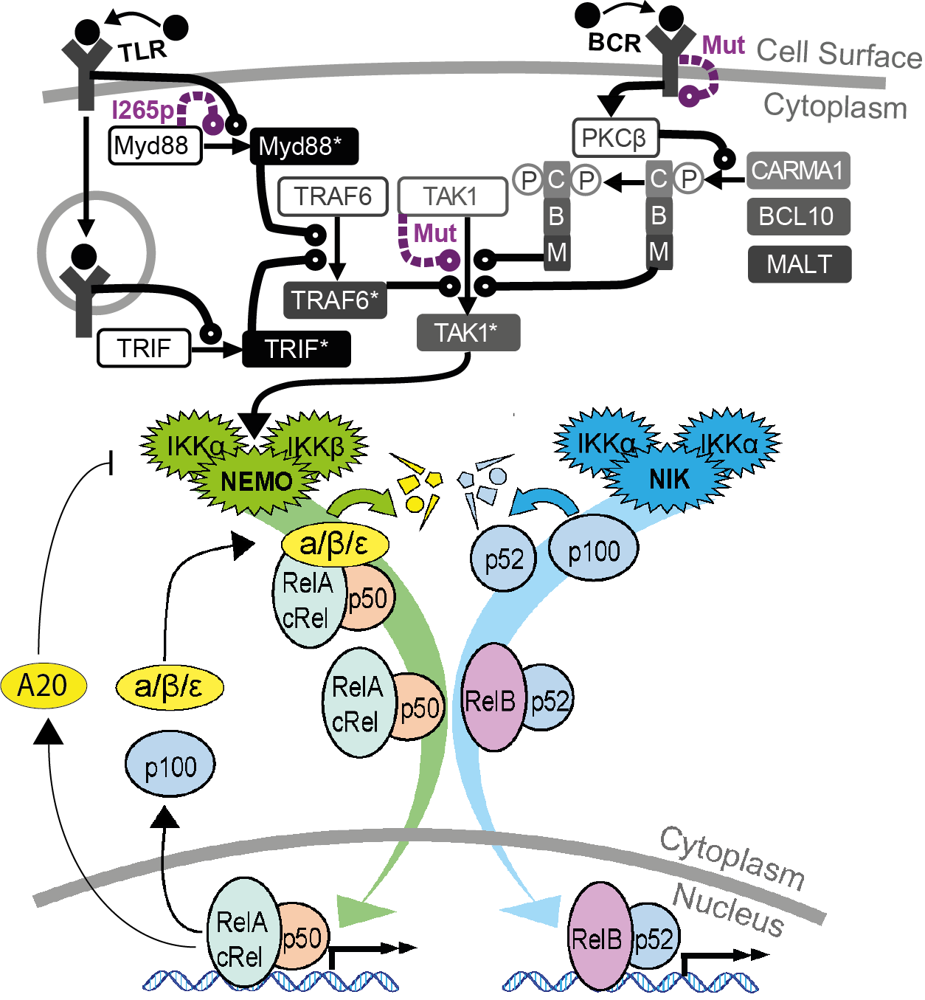

In [1]:
display("image/png", read("triModelA20Diagram.png"))

In [2]:
###########################################################################
### File locations  ######################################################
###########################################################################
### set up where CSV2Julia is
locationOfCSV2Julia="csv2Julia/csv2model-multiscale.py"
#we use the same initial conditions at the PNAS paper 2019 Mitchell Roy et al.
fullModelInitFile="initialConditions/fullModelInits.csv"
moduleDefinitionFilesFolder="moduleDefinitionFiles/"
locationOfFixSpexies="utilityFunctions/"
################################################
### all the packages we need are defined here ##
################################################
import Base.Threads
Threads.nthreads()

32

In [3]:
#packages we need
using DifferentialEquations
using Plots 
using Pkg
# Pkg.add(Pkg.PackageSpec(;name="Parsers", version="2.2.4"))
using CSV
using Distributions
using Random
using DataFrames
using JLD2
using FileIO
using StatsPlots
using Plots.PlotMeasures
using Statistics

In [4]:
delay=false

false

In [5]:
function combineModels(modulesToInclude)
    ################################################
    ### Create a combined model from the modules ###
    ################################################
    #first lets tell Julia where the files are

    linkingModuleName="linking"
    combinedModelLocation="combinedModelDefinitionFiles/"
    mkpath(combinedModelLocation)


    #first lets load the linking file so we know to skip any reactions 
    #which are doubly described by the linking file and one of the modules
    linkingReactions=""
    if(delay)
        linkingReactions = DataFrame(CSV.File(moduleDefinitionFilesFolder*linkingModuleName*"/reactions_withDelay.csv",stringtype=String,types=String))
    else
        linkingReactions = DataFrame(CSV.File(moduleDefinitionFilesFolder*linkingModuleName*"/reactions.csv",stringtype=String,types=String))
    end
    linkingParameters = DataFrame(CSV.File(moduleDefinitionFilesFolder*linkingModuleName*"/parameters.csv",stringtype=String,types=String))
    linkingrateLaws = DataFrame(CSV.File(moduleDefinitionFilesFolder*linkingModuleName*"/rateLaws.csv",stringtype=String,types=String))

    #missing values mess things up so replace with empty strings
    replace!(linkingReactions.Substrate, missing => "")
    replace!(linkingReactions.Products, missing => "")

    #we know we need all the linking reactions in the combined model
    reactionsCombined=linkingReactions
    parametersCombined=linkingParameters
    linkingParameters[:,1]=linkingParameters[:,1].*("-"*"linking")
    theseParams=linkingReactions.Parameters
    replacementParams=""
    newParams=theseParams
    thisLine=1
    for param in theseParams
        if ismissing(param)
            thisLine=thisLine+1
        else
            eachParam=split(param," ")
            eachParam=[i*"-"*"linking" for i in eachParam]
            replacementParams=join(eachParam," ")
            newParams[thisLine]=replacementParams
            thisLine=thisLine+1
        end
    end
    linkingReactions.Parameters=newParams
    rateLawsCombined=linkingrateLaws

    # loop through each model
    for mod in modulesToInclude
        print("adding $(mod) module\n")

        thisModule=moduleDefinitionFilesFolder*mod
        #the NFkB file can have delays but the rest do not
        reactionFile=""
        if mod=="NFkB" && delay
            reactionFile=thisModule*"/reactions_withDelay.csv"
        else
            reactionFile=thisModule*"/reactions.csv"
        end
        parameterFile=thisModule*"/parameters.csv"
        rateLawsFile=thisModule*"/rateLaws.csv"

        parameterDF = CSV.read(parameterFile,DataFrame,stringtype=String,types=String)
        rateLawDF = CSV.read(rateLawsFile,DataFrame,stringtype=String,types=String)
        reactionDF = CSV.read(reactionFile,DataFrame,stringtype=String,types=String)
        #not every entry in the reaction database is filled in and missing data can cause a problem
        replace!(reactionDF.Substrate, missing => "")
        replace!(reactionDF.Products, missing => "")

        #keep track of rows to remove
        #these are rows that appear in individual module reaction files 
        #and are replaced by reactions in the linking module.
        rowsToRemove=[]
        thisRow=1
        for row in eachrow(reactionDF)
            if nrow(linkingReactions[(linkingReactions[!,"Substrate"].==row.Substrate).&(linkingReactions[!,"Products"].==row.Products),:])>0
                print("removing: $(row.Substrate) -> $(row.Products) as it is included in linking file\n")
                push!(rowsToRemove,thisRow)
            end
            thisRow=thisRow+1
        end
        delete!(reactionDF, rowsToRemove)
        print("adding module $(mod) to combined reaction array\n")

        #we need to append a module ID on each parameter name in the reactions file 
        #because some parameters have the same name in multiple modules
        theseParams=reactionDF.Parameters
        replacementParams=""
        newParams=theseParams
        thisLine=1
        for param in theseParams
            eachParam=split(param," ")
            eachParam=[i*"-"*mod for i in eachParam]
            replacementParams=join(eachParam," ")
            newParams[thisLine]=replacementParams
            thisLine=thisLine+1
        end
        reactionDF.Parameters=newParams
        append!(reactionsCombined,reactionDF)

        #do the same, prepending in the parameters file for the combined model
        parameterDF = CSV.read(parameterFile,DataFrame,stringtype=String,types=String)
        rowsToRemove=[]
        thisRow=1
        for row in eachrow(parameterDF)
            if nrow(linkingParameters[(linkingParameters[!,"parameter"].==row.parameter),:])>0
                print("removing: $(row.parameter) as it is included in linking file\n")
                push!(rowsToRemove,thisRow)
#             elseif occursin("p[",row.value)
#                 print("removing: $(row.parameter) as it includes p[t]\n")
#                 push!(rowsToRemove,thisRow)
            end

            thisRow=thisRow+1
        end
        delete!(parameterDF, rowsToRemove)

        theseParams=parameterDF.parameter
        parameterDF.parameter=parameterDF.parameter.*("-"*mod)

        append!(parametersCombined,parameterDF)

        #rate law duplication seems ok and unambiguous for now
        rateLawsDF=CSV.read(rateLawsFile,DataFrame;stringtype=String,types=String)
        append!(rateLawsCombined,rateLawsDF)

        print("finished $(mod)\n\n")
    end
    #write out the combined model
    CSV.write(combinedModelLocation*"reactions.csv", reactionsCombined)
    CSV.write(combinedModelLocation*"parameters.csv", parametersCombined)
    CSV.write(combinedModelLocation*"rateLaws.csv", rateLawsCombined)
    print("finished combining all modules\n")
    return combinedModelLocation
end

combineModels (generic function with 1 method)

In [6]:
using CSV

In [7]:
combinedModelLocation=combineModels(["BCR","TLR","NFkB"])

adding BCR module
removing: TAK1 -> TAK1p as it is included in linking file
removing: TAK1 -> TAK1p as it is included in linking file
removing: TAK1 -> TAK1p as it is included in linking file
removing: TAK1 -> TAK1p as it is included in linking file
removing: TAK1 -> TAK1p as it is included in linking file
removing: TAK1 -> TAK1p as it is included in linking file
removing: TAK1p -> TAK1 as it is included in linking file
removing: TAK1C -> TAK1pC as it is included in linking file
removing: TAK1C -> TAK1pC as it is included in linking file
removing: TAK1C -> TAK1pC as it is included in linking file
removing: TAK1C -> TAK1pC as it is included in linking file
removing: TAK1C -> TAK1pC as it is included in linking file
removing: TAK1C -> TAK1pC as it is included in linking file
removing: TAK1C -> TAK1pC as it is included in linking file
removing: TAK1C -> TAK1pC as it is included in linking file
adding module BCR to combined reaction array
finished BCR

adding TLR module
removing: TAK1 -> T

"combinedModelDefinitionFiles/"

In [8]:
parametersFile=combinedModelLocation*"parameters.csv"
reactionsFile=combinedModelLocation*"reactions.csv"
rateLawsFile=combinedModelLocation*"rateLaws.csv"
parametersDF = DataFrame(CSV.File(parametersFile,types=Dict(:parameter=>String, :value=>String)))
originalParams=deepcopy(parametersDF)

thisModelName="odeModel.jl"
thisParamFile=parametersFile
arguments=[reactionsFile, thisParamFile, rateLawsFile,thisModelName]
cmd=`python3 $locationOfCSV2Julia $arguments param`

#lets run csv2julia (requires python to be installed)
run(cmd)

include(thisModelName)
mkpath("distributedModelFiles")
mv(thisModelName,"distributedModelFiles/"*thisModelName, force=true)
println("Model generated for all conditions")

param
Running CSV2JuliaDiffEq with parameters dynamically determined by a variable, re-run with the 5th argument set to 'scan' or 'inline'
Opening combinedModelDefinitionFiles/rateLaws.csv as rate law file
Opening combinedModelDefinitionFiles/parameters.csv as parameters file
Opening combinedModelDefinitionFiles/reactions.csv as reactions file
Model generated for all conditions


In [9]:
function inputFunc(t)
    if (t<600)
        return 0.01
    else
        return 0.01/(1+((t-20)/60))
    end
#    return maximum([1/(1+((t-10)*10)),0])
end

function inputFuncSS(t)
        return 0   
end
function inputFuncSSHigh(t)
        return 0.005    
end


function inputFuncHigh(t)
    if (t<1)
        return 0.001
    else
        return 0
    end

end
function NIKinputFunc2(t)
# #     if (t>4*60)
# #         return 0.05
# #     else
# #         return 1
# #     end
#     return maximum([),0])
    return 1/(1+(t/60))
end
function NIKFuncSS(t)
    return 1
end


bcrSignalSS=inputFuncSS
bcrSignalSSHigh=inputFuncSSHigh
tlrSignalSS=inputFuncSS
bcrSignalTC=inputFunc
tlrSignalTC=inputFuncHigh
nikSignalSS=NIKFuncSS
nikSignalTC=NIKinputFunc2

NIKinputFunc2 (generic function with 1 method)

In [10]:
#fix the death ligand concentration
t=0
include("distributedModelFiles/odeModel.jl")
include("variableNames.jl")
include("scanIncludes.jl")

parameters can now be searched in parameterNameList by name.
example to modify k_binding 1.5 fold higher:
indexOfParam=findfirst(x->"k_binding"==x,parameterNameList)
paramVals[indexOfParam]=paramVals[indexOfParam]*1.5


In [11]:
include("runSimulation.jl")
include("plotAllSpecies.jl")
colorArray=palette(:seaborn_colorblind)

In [12]:
first_cell=1
last_cell=3
preCV=0.11
maxTimeTC=12*60
maxTimeSS=1000*60

60000

In [152]:
conditions=[]
paramsToChange=[]
modifyAmount=[]
BCRSSArray=[]
BCRTCArray=[]
TLRSSArray=[]
TLRTCArray=[]
NIKSSArray=[]
NIKTCArray=[]


#M-CLL
push!(conditions,"M-CLL no stim")
push!(paramsToChange,["k1_MYD88SELFACTIVATION-TLR"])
push!(modifyAmount,[0.0])
push!(BCRSSArray,bcrSignalSS)
push!(BCRTCArray,bcrSignalSS)
push!(TLRSSArray,tlrSignalSS)
push!(TLRTCArray,tlrSignalSS)
push!(NIKSSArray,nikSignalSS)
push!(NIKTCArray,nikSignalSS)

#U-CLL
push!(conditions,"U-CLL no stim")
push!(paramsToChange,["k1_MYD88SELFACTIVATION-TLR"])
push!(modifyAmount,[0.0])
push!(BCRSSArray,bcrSignalSSHigh)
push!(BCRTCArray,bcrSignalSSHigh)
push!(TLRSSArray,tlrSignalSS)
push!(TLRTCArray,tlrSignalSS)
push!(NIKSSArray,nikSignalSS)
push!(NIKTCArray,nikSignalSS)

#M-CLL
push!(conditions,"M-CLL CpG")
push!(paramsToChange,["k1_MYD88SELFACTIVATION-TLR"])
push!(modifyAmount,[0.0])
push!(BCRSSArray,bcrSignalSS)
push!(BCRTCArray,bcrSignalSS)
push!(TLRSSArray,tlrSignalSS)
push!(TLRTCArray,tlrSignalTC)
push!(NIKSSArray,nikSignalSS)
push!(NIKTCArray,nikSignalSS)

#U-CLL
push!(conditions,"U-CLL CpG")
push!(paramsToChange,["k1_MYD88SELFACTIVATION-TLR"])
push!(modifyAmount,[0.0])
push!(BCRSSArray,bcrSignalSSHigh)
push!(BCRTCArray,bcrSignalSSHigh)
push!(TLRSSArray,tlrSignalSS)
push!(TLRTCArray,tlrSignalTC)
push!(NIKSSArray,nikSignalSS)
push!(NIKTCArray,nikSignalSS)

#M-CLL+Ibr
push!(conditions,"M-CLLIbr CpG")
push!(paramsToChange,["k1_MYD88SELFACTIVATION-TLR","k1_CpS-BCR","k1_CpBS-BCR","k1_CpMS-BCR","k1_CpBMS-BCR","k1_Cp0-BCR"])
push!(modifyAmount,[0.0,0.0,0.0,0.0,0.0,0.0])
push!(BCRSSArray,bcrSignalSS)
push!(BCRTCArray,bcrSignalSS)
push!(TLRSSArray,tlrSignalSS)
push!(TLRTCArray,tlrSignalTC)
push!(NIKSSArray,nikSignalSS)
push!(NIKTCArray,nikSignalSS)

#M-CLL+Ibr
push!(conditions,"M-CLLIbr No Stim")
push!(paramsToChange,["k1_MYD88SELFACTIVATION-TLR","k1_CpS-BCR","k1_CpBS-BCR","k1_CpMS-BCR","k1_CpBMS-BCR","k1_Cp0-BCR"])
push!(modifyAmount,[0.0,0.0,0.0,0.0,0.0,0.0])
push!(BCRSSArray,bcrSignalSS)
push!(BCRTCArray,bcrSignalSS)
push!(TLRSSArray,tlrSignalSS)
push!(TLRTCArray,tlrSignalSS)
push!(NIKSSArray,nikSignalSS)
push!(NIKTCArray,nikSignalSS)

#U-CLL+Ibr+CpG
push!(conditions,"U-CLLIbr CpG")
push!(paramsToChange,["k1_MYD88SELFACTIVATION-TLR","k1_CpS-BCR","k1_CpBS-BCR","k1_CpMS-BCR","k1_CpBMS-BCR","k1_Cp0-BCR"])
push!(modifyAmount,[0.0,0.0,0.0,0.0,0.0,0.0])
push!(BCRSSArray,bcrSignalSSHigh)
push!(BCRTCArray,bcrSignalSSHigh)
push!(TLRSSArray,tlrSignalSS)
push!(TLRTCArray,tlrSignalTC)
push!(NIKSSArray,nikSignalSS)
push!(NIKTCArray,nikSignalSS)

#U-CLL+Ibr+CpG
push!(conditions,"U-CLLIbr No Stim")
push!(paramsToChange,["k1_MYD88SELFACTIVATION-TLR","k1_CpS-BCR","k1_CpBS-BCR","k1_CpMS-BCR","k1_CpBMS-BCR","k1_Cp0-BCR"])
push!(modifyAmount,[0.0,0.0,0.0,0.0,0.0,0.0])
push!(BCRSSArray,bcrSignalSSHigh)
push!(BCRTCArray,bcrSignalSSHigh)
push!(TLRSSArray,tlrSignalSS)
push!(TLRTCArray,tlrSignalSS)
push!(NIKSSArray,nikSignalSS)
push!(NIKTCArray,nikSignalSS)


# #BCR Only
# push!(conditions,"BCRonly")
# push!(paramsToChange,["k1_MYD88SELFACTIVATION-TLR"])
# push!(modifyAmount,[0.0])
# push!(BCRSSArray,bcrSignalSS)
# push!(BCRTCArray,bcrSignalTC)
# push!(TLRSSArray,tlrSignalSS)
# push!(TLRTCArray,tlrSignalSS)
# push!(NIKSSArray,nikSignalSS)
# push!(NIKTCArray,nikSignalSS)

# #NIK Only
# push!(conditions,"NIKonly")
# push!(paramsToChange,["k1_MYD88SELFACTIVATION-TLR"])
# push!(modifyAmount,[0.0])
# push!(BCRSSArray,bcrSignalSS)
# push!(BCRTCArray,bcrSignalSS)
# push!(TLRSSArray,tlrSignalSS)
# push!(TLRTCArray,tlrSignalSS)
# push!(NIKSSArray,nikSignalSS)
# push!(NIKTCArray,nikSignalTC)

# #BCR + TLR 
# push!(conditions,"bothStim")
# push!(paramsToChange,["k1_MYD88SELFACTIVATION-TLR"])
# push!(modifyAmount,[0.0])
# push!(BCRSSArray,bcrSignalSS)
# push!(BCRTCArray,bcrSignalTC)
# push!(TLRSSArray,tlrSignalSS)
# push!(TLRTCArray,tlrSignalTC)
# push!(NIKSSArray,nikSignalSS)
# push!(NIKTCArray,nikSignalSS)

# #BCR + TLR +NIK
# push!(conditions,"triStim")
# push!(paramsToChange,["k1_MYD88SELFACTIVATION-TLR"])
# push!(modifyAmount,[0.0])
# push!(BCRSSArray,bcrSignalSS)
# push!(BCRTCArray,bcrSignalTC)
# push!(TLRSSArray,tlrSignalSS)
# push!(TLRTCArray,tlrSignalTC)
# push!(NIKSSArray,nikSignalSS)
# push!(NIKTCArray,nikSignalTC)


# #BCR + TLR +NIK +A20KO
# push!(conditions,"A20KO")
# push!(paramsToChange,["k1_A20mRNAExpression-linking","k1_A20mRNANFkBDep-linking"])
# push!(modifyAmount,[0.0,0.0])
# push!(BCRSSArray,bcrSignalSS)
# push!(BCRTCArray,bcrSignalTC)
# push!(TLRSSArray,tlrSignalSS)
# push!(TLRTCArray,tlrSignalTC)
# push!(NIKSSArray,nikSignalSS)
# push!(NIKTCArray,nikSignalTC)

# #NoStim
# push!(conditions,"NoStim")
# push!(paramsToChange,["k1_MYD88SELFACTIVATION-TLR"])
# push!(modifyAmount,[0.0])
# push!(BCRSSArray,bcrSignalSS)
# push!(BCRTCArray,bcrSignalSS)
# push!(TLRSSArray,tlrSignalSS)
# push!(TLRTCArray,tlrSignalSS)
# push!(NIKSSArray,nikSignalSS)
# push!(NIKTCArray,nikSignalSS)


println("Summary of conditions being run:")
folder="outputs"
show(IOContext(stdout, :limit => false), "text/plain", hcat(conditions,paramsToChange,modifyAmount))

Summary of conditions being run:
8×3 Matrix{Any}:
 "M-CLL no stim"     ["k1_MYD88SELFACTIVATION-TLR"]                                                                            [0.0]
 "U-CLL no stim"     ["k1_MYD88SELFACTIVATION-TLR"]                                                                            [0.0]
 "M-CLL CpG"         ["k1_MYD88SELFACTIVATION-TLR"]                                                                            [0.0]
 "U-CLL CpG"         ["k1_MYD88SELFACTIVATION-TLR"]                                                                            [0.0]
 "M-CLLIbr CpG"      ["k1_MYD88SELFACTIVATION-TLR", "k1_CpS-BCR", "k1_CpBS-BCR", "k1_CpMS-BCR", "k1_CpBMS-BCR", "k1_Cp0-BCR"]  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
 "M-CLLIbr No Stim"  ["k1_MYD88SELFACTIVATION-TLR", "k1_CpS-BCR", "k1_CpBS-BCR", "k1_CpMS-BCR", "k1_CpBMS-BCR", "k1_Cp0-BCR"]  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
 "U-CLLIbr CpG"      ["k1_MYD88SELFACTIVATION-TLR", "k1_CpS-BCR", "k1_CpBS-BCR", "k1_CpMS-BCR", "k1_Cp

In [14]:
runSimulation(first_cell,last_cell,conditions,folder,BCRSSArray,BCRTCArray,TLRSSArray,TLRTCArray,NIKSSArray,NIKTCArray)

parameters can now be searched in parameterNameList by name.
example to modify k_binding 1.5 fold higher:
indexOfParam=findfirst(x->"k_binding"==x,parameterNameList)
paramVals[indexOfParam]=paramVals[indexOfParam]*1.5
Starting condition: M-CLL no stim
starting cell: 1
Steady state found for cell: 1
Solving equations for dynamic time course for cell:1
starting cell: 2
Steady state found for cell: 2
Solving equations for dynamic time course for cell:2
starting cell: 3
Steady state found for cell: 3
Solving equations for dynamic time course for cell:3
all cells done in condition: M-CLL no stim
Starting condition: U-CLL no stim
starting cell: 1
Steady state found for cell: 1
Solving equations for dynamic time course for cell:1
starting cell: 2
Steady state found for cell: 2
Solving equations for dynamic time course for cell:2
starting cell: 3
Steady state found for cell: 3
Solving equations for dynamic time course for cell:3
all cells done in condition: U-CLL no stim
Starting condition: M-

In [15]:
folder="outputs"
hoursToPlot=12
colorArray=palette(:seaborn_colorblind)

speciesToPlot=syms
maxValOfYAxis=0
# speciesToPlot=["IKK_on","IKK_off","IKK_i"]
# qualityScaling=0.5
# plotly()
# #let't plot!
# plotAllSpecies(speciesToPlot,conditions,colorArray,first_cell,last_cell,folder,hoursToPlot,maxValOfYAxis,qualityScaling,60);

0

In [16]:
speciesToPlot=["RelAnp50n","cRelnp50n","RelBnp52n"]
qualityScaling=0.5
plotly()
#let't plot!
plotAllSpecies(speciesToPlot,conditions,colorArray,first_cell,last_cell,folder,hoursToPlot,maxValOfYAxis,qualityScaling,60);

In [17]:
speciesToPlot=["TAK1p"]
qualityScaling=0.5
plotly()
#let't plot!
plotAllSpecies(speciesToPlot,conditions,colorArray,first_cell,last_cell,folder,hoursToPlot,maxValOfYAxis,qualityScaling,60);

8-element Vector{Any}:
 "M-CLL no stim"
 "U-CLL no stim"
 "M-CLL CpG"
 "U-CLL CpG"
 "M-CLLIbr CpG"
 "M-CLLIbr No Stim"
 "U-CLLIbr CpG"
 "U-CLLIbr No Stim"

In [19]:
thisColorArray=colorArray[[9,1,3,10]]
thisConditions=conditions[[1,3,5,6]]
speciesToPlot=["RelAnp50n"]
qualityScaling=0.5
plotly()
#let't plot!
plotAllSpecies(speciesToPlot,thisConditions,thisColorArray,first_cell,last_cell,folder,hoursToPlot,maxValOfYAxis,qualityScaling,60);

In [29]:
plotAllSpeciesOffset(speciesToPlot,thisConditions,thisColorArray,first_cell,last_cell,folder,hoursToPlot,maxValOfYAxis,qualityScaling,60);

LoadError: UndefVarError: plotAllSpeciesOffset not defined

In [20]:
thisColorArray=colorArray[[9,1,3,10]]
thisConditions=conditions[[2,4,7,8]]
speciesToPlot=["RelAnp50n"]
qualityScaling=0.5
plotly()
#let't plot!
plotAllSpecies(speciesToPlot,thisConditions,thisColorArray,first_cell,last_cell,folder,hoursToPlot,maxValOfYAxis,qualityScaling,60);

In [30]:
plotAllSpeciesOffset(speciesToPlot,thisConditions,thisColorArray,first_cell,last_cell,folder,hoursToPlot,maxValOfYAxis,qualityScaling,60);

LoadError: UndefVarError: plotAllSpeciesOffset not defined

In [156]:
thisColorArray=colorArray[[1]]
thisConditions=conditions[[3]]
speciesToPlot=["RelAnp50n"]
folder="outputs"
qualityScaling=0.5
plotly()
#let't plot!
plotAllSpecies(speciesToPlot,thisConditions,thisColorArray,first_cell,last_cell,folder,hoursToPlot,40,qualityScaling,60);

In [155]:
thisColorArray=colorArray[[2]]
thisConditions=conditions[[4]]
speciesToPlot=["RelAnp50n"]
qualityScaling=0.5
plotly()
#let't plot!
plotAllSpecies(speciesToPlot,thisConditions,thisColorArray,first_cell,last_cell,folder,hoursToPlot,40,qualityScaling,60);

In [22]:
# I need to do a scan of different levels of TLR expression vs different levels of basal BCR signalling
# think about a 10x10 heatmap
# at each point i need to do a simulation with and without ibrutinib (BTK inhibition)
# I need to calculate the maximum fold induction of RelA:p50 and make a heatmap using that as the colour


# TLRExpressionScaling=[0.001,0.01,0.1,1.0,10,100,1000]
# BasalBCRScaling=[0,0.00000005,0.0000005,0.000005,0.00005,0.0005,0.005]

TLRExpressionScaling=[0.001,0.01,0.1,1.0,10,100,1000]
BasalBCRScaling=[0,0.00000005,0.0000005,0.000005,0.00005,0.0005,0.005,0.05,0.5]

folder="heatmap"

    

conditions=[]
paramsToChange=[]
modifyAmount=[]
BCRSSArray=[]
BCRTCArray=[]
TLRSSArray=[]
TLRTCArray=[]
NIKSSArray=[]
NIKTCArray=[]

heatmapArray=zeros(length(TLRExpressionScaling),length(BasalBCRScaling))
for i in 1:length(TLRExpressionScaling)
        thisTLRScaling=TLRExpressionScaling[i]
        for j in 1:length(BasalBCRScaling)
            thisBCRVal=BasalBCRScaling[j]
            push!(conditions,"TLR"*string(i)*"-BCR"*string(j))
            push!(paramsToChange,["k1_MYD88SELFACTIVATION-TLR","k1_TLR4synth-TLR"])
            push!(modifyAmount,[0.0,thisTLRScaling])
            push!(BCRSSArray,x -> thisBCRVal)
            push!(BCRTCArray,x -> thisBCRVal)
            push!(TLRSSArray,tlrSignalSS)
            push!(TLRTCArray,tlrSignalTC)
            push!(NIKSSArray,nikSignalSS)
            push!(NIKTCArray,nikSignalSS)                

            
            push!(conditions,"TLR"*string(i)*"-BCR"*string(j)*"-Ibr")
            push!(paramsToChange,["k1_MYD88SELFACTIVATION-TLR","k1_CpS-BCR","k1_CpBS-BCR","k1_CpMS-BCR","k1_CpBMS-BCR","k1_Cp0-BCR","k1_TLR4synth-TLR"])
            push!(modifyAmount,[0.0,0.0,0.0,0.0,0.0,0.0,thisTLRScaling])
            push!(BCRSSArray,x -> thisBCRVal)
            push!(BCRTCArray,x -> thisBCRVal)
            push!(TLRSSArray,tlrSignalSS)
            push!(TLRTCArray,tlrSignalTC)
            push!(NIKSSArray,nikSignalSS)
            push!(NIKTCArray,nikSignalSS)                
        end
end



In [23]:
runSimulation(1,1,conditions,folder,BCRSSArray,BCRTCArray,TLRSSArray,TLRTCArray,NIKSSArray,NIKTCArray)

parameters can now be searched in parameterNameList by name.
example to modify k_binding 1.5 fold higher:
indexOfParam=findfirst(x->"k_binding"==x,parameterNameList)
paramVals[indexOfParam]=paramVals[indexOfParam]*1.5
Starting condition: TLR1-BCR1
starting cell: 1
Steady state found for cell: 1
Solving equations for dynamic time course for cell:1
all cells done in condition: TLR1-BCR1
Starting condition: TLR1-BCR1-Ibr
starting cell: 1
Steady state found for cell: 1
Solving equations for dynamic time course for cell:1
all cells done in condition: TLR1-BCR1-Ibr
Starting condition: TLR1-BCR2
starting cell: 1
Steady state found for cell: 1
Solving equations for dynamic time course for cell:1
all cells done in condition: TLR1-BCR2
Starting condition: TLR1-BCR2-Ibr
starting cell: 1
Steady state found for cell: 1
Solving equations for dynamic time course for cell:1
all cells done in condition: TLR1-BCR2-Ibr
Starting condition: TLR1-BCR3
starting cell: 1
Steady state found for cell: 1
Solving 

Steady state found for cell: 1
Solving equations for dynamic time course for cell:1
all cells done in condition: TLR3-BCR6
Starting condition: TLR3-BCR6-Ibr
starting cell: 1
Steady state found for cell: 1
Solving equations for dynamic time course for cell:1
all cells done in condition: TLR3-BCR6-Ibr
Starting condition: TLR3-BCR7
starting cell: 1
Steady state found for cell: 1
Solving equations for dynamic time course for cell:1
all cells done in condition: TLR3-BCR7
Starting condition: TLR3-BCR7-Ibr
starting cell: 1
Steady state found for cell: 1
Solving equations for dynamic time course for cell:1
all cells done in condition: TLR3-BCR7-Ibr
Starting condition: TLR3-BCR8
starting cell: 1
Steady state found for cell: 1
Solving equations for dynamic time course for cell:1
all cells done in condition: TLR3-BCR8
Starting condition: TLR3-BCR8-Ibr
starting cell: 1
Steady state found for cell: 1
Solving equations for dynamic time course for cell:1
all cells done in condition: TLR3-BCR8-Ibr
Sta

all cells done in condition: TLR6-BCR2-Ibr
Starting condition: TLR6-BCR3
starting cell: 1
Steady state found for cell: 1
Solving equations for dynamic time course for cell:1
all cells done in condition: TLR6-BCR3
Starting condition: TLR6-BCR3-Ibr
starting cell: 1
Steady state found for cell: 1
Solving equations for dynamic time course for cell:1
all cells done in condition: TLR6-BCR3-Ibr
Starting condition: TLR6-BCR4
starting cell: 1
Steady state found for cell: 1
Solving equations for dynamic time course for cell:1
all cells done in condition: TLR6-BCR4
Starting condition: TLR6-BCR4-Ibr
starting cell: 1
Steady state found for cell: 1
Solving equations for dynamic time course for cell:1
all cells done in condition: TLR6-BCR4-Ibr
Starting condition: TLR6-BCR5
starting cell: 1
Steady state found for cell: 1
Solving equations for dynamic time course for cell:1
all cells done in condition: TLR6-BCR5
Starting condition: TLR6-BCR5-Ibr
starting cell: 1
Steady state found for cell: 1
Solving e

In [24]:
heatmapArray=zeros(length(TLRExpressionScaling),length(BasalBCRScaling))
heatmapArrayIbr=zeros(length(TLRExpressionScaling),length(BasalBCRScaling))

for i in 1:length(TLRExpressionScaling)
        for j in 1:length(BasalBCRScaling)
           thisFile="heatmap/sol_TLR"*string(i)*"-BCR"*string(j)*"_cell_1.csv"
           thisFileIbr="heatmap/sol_TLR"*string(i)*"-BCR"*string(j)*"-Ibr_cell_1.csv"
           thisCellData=DataFrame(CSV.File(thisFile))
           thisCellDataIbr=DataFrame(CSV.File(thisFileIbr))
            if !("names" in names(thisCellData))
                insertcols!(thisCellData, 1, :names=>syms)
                insertcols!(thisCellDataIbr, 1, :names=>syms)
            end
            
            thisTC=Matrix(thisCellData[thisCellData[!,:names].=="RelAnp50n",:])[2:end]
            thisTCIbr=Matrix(thisCellDataIbr[thisCellDataIbr[!,:names].=="RelAnp50n",:])[2:end]
            thisFC=maximum(thisTC)./thisTC[1]
            thisFCIbr=maximum(thisTCIbr)./thisTCIbr[1]
            heatmapArray[i,j]=thisFC
            heatmapArrayIbr[i,j]=thisFCIbr
        end
end

In [25]:
heatmap(heatmapArray,ylabel="TLR",xlabel="BCR")

In [26]:
heatmap(heatmapArrayIbr,ylabel="TLR",xlabel="BCR")

In [52]:
gr()
test=surface(heatmapArray,ylabel="TLR",xlabel="BCR",size=(1000,1000),camera = (60, 15),dpi=600)
plot!(repeat([8],7),[1:1:7],heatmapArray[1:7,8],color=:red, linewidth=0)
plot!(repeat([1.5],7),[1:1:7],heatmapArray[1:7,1],color=:red, linewidth=0)
savefig("untreated.png")

"/home/simon/ArranA20Addition/untreated.png"

In [53]:
# gr()
test=surface(heatmapArray,ylabel="TLR",xlabel="BCR",size=(1000,1000),camera = (60, 15),dpi=600)
plot!(repeat([8],7),[1:1:7],heatmapArray[1:7,8],color=:red, linewidth=10)
plot!(repeat([1.5],7),[1:1:7],heatmapArray[1:7,1],color=:red, linewidth=5)
savefig("untreatedWithLines.png")

"/home/simon/ArranA20Addition/untreatedWithLines.png"

In [54]:
test=surface(heatmapArrayIbr,ylabel="TLR",xlabel="BCR",size=(1000,1000),camera = (60, 15),dpi=600)
plot!(repeat([8],7),[1:1:7],heatmapArray[1:7,8],color=:red, linewidth=0)
plot!(repeat([1.5],7),[1:1:7],heatmapArray[1:7,1],color=:red, linewidth=0)
savefig("Ibr.png")

"/home/simon/ArranA20Addition/Ibr.png"

In [55]:
test=surface(heatmapArrayIbr,ylabel="TLR",xlabel="BCR",size=(1000,1000),camera = (60, 15),dpi=600)
plot!(repeat([8],7),[1:1:7],heatmapArrayIbr[1:7,8],color=:red, linewidth=5)
plot!(repeat([1.5],7),[1:1:7],heatmapArrayIbr[1:7,1],color=:red, linewidth=5)
savefig("IbrWithLines.png")

"/home/simon/ArranA20Addition/IbrWithLines.png"

In [75]:
gr()
test=surface(heatmapArrayIbr,ylabel="TLR",xlabel="BCR",size=(1000,1000),camera = (60, 15),dpi=600)
# plot!(repeat([8],7),[1:1:7],heatmapArrayIbr[1:7,8],color=:red, linewidth=5)
plot!(repeat([1.5],7),[1:1:7],heatmapArrayIbr[1:7,1],color=:red, linewidth=5)
plot!([1.5],[7],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([1.5],[1.5],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([1.5,1.5],[7,7],[12,heatmapArrayIbr[7,1]],markershape=:none,markersize=10,linewidth=2,color=:red)
plot!([1.5,1.5],[1.5,1.5],[12,heatmapArrayIbr[1,1]],markershape=:none,markersize=10,linewidth=2,color=:red)
savefig("IbrWithLinesResponder.png")

"/home/simon/ArranA20Addition/IbrWithLinesResponder.png"

In [100]:
gr()
test=surface(heatmapArray,ylabel="TLR",xlabel="BCR",size=(1000,1000),camera = (60, 15),dpi=600)
# plot!(repeat([8],7),[1:1:7],heatmapArray[1:7,8],color=:red, linewidth=5)
plot!(repeat([1.5],7),[1:1:7],heatmapArray[1:7,1],color=:red, linewidth=5)
plot!(repeat([8],7),[1:1:7],heatmapArray[1:7,8],color=:red, linewidth=5)

plot!([1.5],[7],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([1.5],[1.5],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([1.5,1.5],[7,7],[12,heatmapArray[7,1]],markershape=:none,markersize=10,linewidth=2,color=:red)
plot!([1.5,1.5],[1.5,1.5],[12,heatmapArray[1,1]],markershape=:none,markersize=10,linewidth=2,color=:red)
plot!([8],[7],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([8],[1.5],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([8,8],[7,7],[12,heatmapArray[7,8]],markershape=:none,markersize=10,linewidth=2,color=:red)
plot!([8,8],[1.5,1.5],[12,heatmapArray[1,8]],markershape=:none,markersize=10,linewidth=2,color=:red)
plot!(legend=false)
savefig("untreatedWithLines4Corners.png")

"/home/simon/ArranA20Addition/untreatedWithLines4Corners.png"

In [101]:
gr()
test=surface(heatmapArray,ylabel="TLR",xlabel="BCR",size=(1000,1000),camera = (60, 15),dpi=600)
# plot!(repeat([8],7),[1:1:7],heatmapArray[1:7,8],color=:red, linewidth=5)

plot!([1.5],[7],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([1.5],[1.5],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([1.5,1.5],[7,7],[12,heatmapArray[7,1]],markershape=:none,markersize=10,linewidth=2,color=:red)
plot!([1.5,1.5],[1.5,1.5],[12,heatmapArray[1,1]],markershape=:none,markersize=10,linewidth=2,color=:red)
plot!([8],[7],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([8],[1.5],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([8,8],[7,7],[12,heatmapArray[7,8]],markershape=:none,markersize=10,linewidth=2,color=:red)
plot!([8,8],[1.5,1.5],[12,heatmapArray[1,8]],markershape=:none,markersize=10,linewidth=2,color=:red)
plot!(legend=false)
savefig("untreatedWithLines4CornersNoLines.png")

"/home/simon/ArranA20Addition/untreatedWithLines4CornersNoLines.png"

In [99]:
gr()
test=surface(heatmapArray,ylabel="TLR",xlabel="BCR",size=(1000,1000),camera = (60, 15),dpi=600)
# plot!(repeat([8],7),[1:1:7],heatmapArray[1:7,8],color=:red, linewidth=5)
plot!(repeat([1.5],7),[1:1:7],heatmapArray[1:7,1],color=:red, linewidth=5)
plot!([1.5],[7],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([1.5],[1.5],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([1.5,1.5],[7,7],[12,heatmapArray[7,1]],markershape=:none,markersize=10,linewidth=2,color=:red)
plot!([1.5,1.5],[1.5,1.5],[12,heatmapArray[1,1]],markershape=:none,markersize=10,linewidth=2,color=:red)

savefig("untreatedWithLinesResponder.png")

"/home/simon/ArranA20Addition/untreatedWithLinesResponder.png"

In [76]:
gr()
test=surface(heatmapArrayIbr,ylabel="TLR",xlabel="BCR",size=(1000,1000),camera = (60, 15),dpi=600)
plot!(repeat([8],7),[1:1:7],heatmapArrayIbr[1:7,8],color=:red, linewidth=5)
#plot!(repeat([1.5],7),[1:1:7],heatmapArrayIbr[1:7,1],color=:red, linewidth=5)
plot!([8],[7],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([8],[1.5],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([8,8],[7,7],[12,heatmapArrayIbr[7,8]],markershape=:none,markersize=10,linewidth=2,color=:red)
plot!([8,8],[1.5,1.5],[12,heatmapArrayIbr[1,8]],markershape=:none,markersize=10,linewidth=2,color=:red)
savefig("IbrWithLinesNonResponder.png")

test=surface(heatmapArray,ylabel="TLR",xlabel="BCR",size=(1000,1000),camera = (60, 15),dpi=600)
plot!(repeat([8],7),[1:1:7],heatmapArray[1:7,8],color=:red, linewidth=5)
#plot!(repeat([1.5],7),[1:1:7],heatmapArray[1:7,1],color=:red, linewidth=5)
plot!([8],[7],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([8],[1.5],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([8,8],[7,7],[12,heatmapArray[7,8]],markershape=:none,markersize=10,linewidth=2,color=:red)
plot!([8,8],[1.5,1.5],[12,heatmapArray[1,8]],markershape=:none,markersize=10,linewidth=2,color=:red)
savefig("untreatedWithLinesNonResponder.png")

"/home/simon/ArranA20Addition/untreatedWithLinesNonResponder.png"

In [81]:
test=surface(heatmapArray,ylabel="TLR",xlabel="BCR",size=(1000,1000),camera = (60, 15),dpi=600)
plot!(repeat([8],7),[1:1:7],heatmapArray[1:7,8],color=:red, linewidth=5)
plot!(repeat([7],7),[1:1:7],heatmapArray[1:7,7],color=:red, linewidth=5)
plot!(repeat([6],7),[1:1:7],heatmapArray[1:7,6],color=:red, linewidth=5)
#plot!(repeat([1.5],7),[1:1:7],heatmapArray[1:7,1],color=:red, linewidth=5)
plot!([8],[7],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([7],[7],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([6],[7],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([8],[1.5],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([7],[1.5],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([6],[1.5],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([8,8],[7,7],[12,heatmapArray[7,8]],markershape=:none,markersize=10,linewidth=2,color=:red)
plot!([8,8],[1.5,1.5],[12,heatmapArray[1,8]],markershape=:none,markersize=10,linewidth=2,color=:red)
plot!([7,7],[7,7],[12,heatmapArray[7,7]],markershape=:none,markersize=10,linewidth=2,color=:red)
plot!([7,7],[1.5,1.5],[12,heatmapArray[1,7]],markershape=:none,markersize=10,linewidth=2,color=:red)
plot!([6,6],[7,7],[12,heatmapArray[7,6]],markershape=:none,markersize=10,linewidth=2,color=:red)
plot!([6,6],[1.5,1.5],[12,heatmapArray[1,6]],markershape=:none,markersize=10,linewidth=2,color=:red)
plot!(legend=false)
savefig("inverseCorrelation.png")

"/home/simon/ArranA20Addition/inverseCorrelation.png"

In [94]:
test=surface(heatmapArray,ylabel="TLR",xlabel="BCR",size=(1000,1000),camera = (60, 15),dpi=600)
plot!(repeat([8],7),[1:1:7],heatmapArray[1:7,8],color=:red, linewidth=3)
plot!(repeat([8],4),[1:1:4],heatmapArray[1:4,8],color=:red, linewidth=7)
plot!(repeat([8],2),[1:1:2],heatmapArray[1:2,8],color=:red, linewidth=10)
#plot!(repeat([1.5],7),[1:1:7],heatmapArray[1:7,1],color=:red, linewidth=5)
plot!([8],[7],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([8],[4],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([8],[2],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
# plot!([8],[1.5],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([8,8],[7,7],[12,heatmapArray[7,8]],markershape=:none,markersize=10,linewidth=2,color=:red)
# plot!([8,8],[1.5,1.5],[12,heatmapArray[1,8]],markershape=:none,markersize=10,linewidth=2,color=:red)
plot!([8,8],[4,4],[12,heatmapArray[4,8]],markershape=:none,markersize=10,linewidth=2,color=:red)
# plot!([8,8],[1.5,1.5],[12,heatmapArray[4,8]],markershape=:none,markersize=10,linewidth=2,color=:red)
plot!([8,8],[2,2],[12,heatmapArray[2,8]],markershape=:none,markersize=10,linewidth=2,color=:red)
# plot!([8,8],[1.5,1.5],[12,heatmapArray[2,8]],markershape=:none,markersize=10,linewidth=2,color=:red)
plot!(legend=false)
savefig("postiveCorrelationNoIbr.png")

test=surface(heatmapArrayIbr,ylabel="TLR",xlabel="BCR",size=(1000,1000),camera = (60, 15),dpi=600)
plot!(repeat([8],7),[1:1:7],heatmapArrayIbr[1:7,8],color=:red, linewidth=3)
plot!(repeat([8],4),[1:1:4],heatmapArrayIbr[1:4,8],color=:red, linewidth=7)
plot!(repeat([8],2),[1:1:2],heatmapArrayIbr[1:2,8],color=:red, linewidth=10)
#plot!(repeat([1.5],7),[1:1:7],heatmapArray[1:7,1],color=:red, linewidth=5)
plot!([8],[7],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([8],[4],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([8],[2],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
# plot!([8],[1.5],[12],markershape=:circle,markersize=10,markerstrokewidth=0,markercolor=:red)
plot!([8,8],[7,7],[12,heatmapArrayIbr[7,8]],markershape=:none,markersize=10,linewidth=2,color=:red)
# plot!([8,8],[1.5,1.5],[12,heatmapArrayIbr[1,8]],markershape=:none,markersize=10,linewidth=2,color=:red)
plot!([8,8],[4,4],[12,heatmapArrayIbr[4,8]],markershape=:none,markersize=10,linewidth=2,color=:red)
# plot!([8,8],[1.5,1.5],[12,heatmapArrayIbr[4,8]],markershape=:none,markersize=10,linewidth=2,color=:red)
plot!([8,8],[2,2],[12,heatmapArrayIbr[2,8]],markershape=:none,markersize=10,linewidth=2,color=:red)
# plot!([8,8],[1.5,1.5],[12,heatmapArrayIbr[2,8]],markershape=:none,markersize=10,linewidth=2,color=:red)
plot!(legend=false)
savefig("postiveCorrelationWithIbr.png")

"/home/simon/ArranA20Addition/postiveCorrelationWithIbr.png"

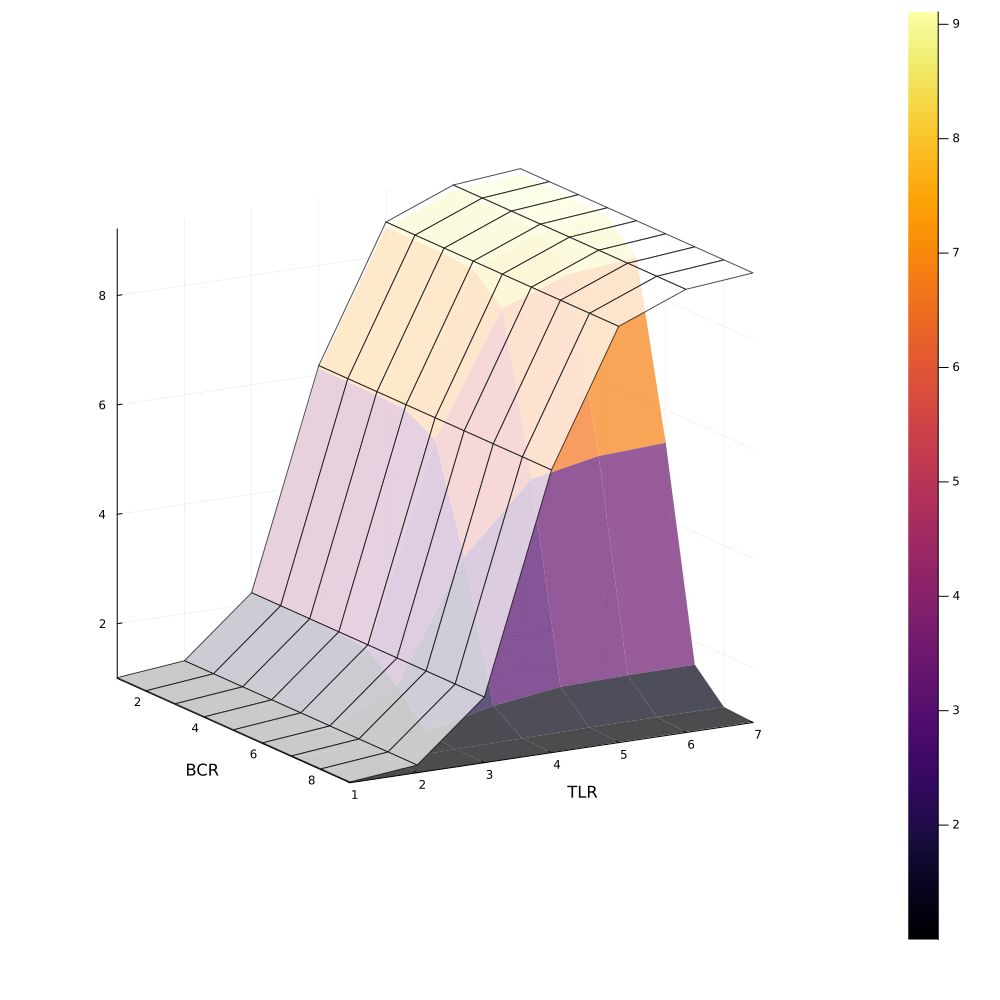

In [148]:
gr()
test=surface(heatmapArray,ylabel="TLR",xlabel="BCR",size=(1000,1000),camera = (60, 15),dpi=600,alpha=0.7)
# plot!(repeat([8],7),[1:1:7],heatmapArrayIbr[1:7,8],color=:red, linewidth=5)
#plot!(repeat([1.5],7),[1:1:7],heatmapArrayIbr[1:7,1],color=:red, linewidth=5)
# surface!(heatmapArrayIbr,ylabel="TLR",xlabel="BCR",size=(1000,1000),camera = (60, 15),dpi=600,alpha=0.5,contours=true,fillalpha=0.7,linewidth=2.0)
wireframe!(heatmapArrayIbr,ylabel="TLR",xlabel="BCR",size=(1000,1000),camera = (60, 15),dpi=600,seriestype=:wireframe,alpha=0.5,contours=true,linewidth=2.0)


# plot!(repeat([8],7),[1:1:7],heatmapArray[1:7,8],color=:red, linewidth=5)
#plot!(repeat([1.5],7),[1:1:7],heatmapArray[1:7,1],color=:red, linewidth=5)

